In [4]:
import pm4py

event_log = pm4py.read_xes("data/Road_Traffic_Fine_Management_Process.xes")


/Users/leonardorossi/Desktop/UNI/Semester5/Process mining/Asssignment/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
parsing log, completed traces :: 100%|██████████| 150370/150370 [00:10<00:00, 13834.07it/s]


# Session 1

## Task 1.1

- *a)* 2000-01-01 00:00:00+00:00 to 2013-06-18 00:00:00+00:00
- *b)* 113
- *c)*
    - *min:* 0.0
    - *median:* 35.0
    - *max:* 4351.0
    - *recommendation:* The median is very distant from the maximum, in fact only 9 entries have an initial fine amount of over 900. 
- *d)* 4,160 / 4124

# Session 2

## Task 1

In [10]:
import pandas as pd


# First, sort by case identifier and by time or event order if available
event_log = event_log.sort_values(by='case:concept:name')

event_log['paymentAmount'] = event_log['paymentAmount'].fillna(0)

# Now, calculate the cumulative sum for each case
event_log['cumulativePayment'] = event_log.groupby('case:concept:name')['paymentAmount'].cumsum()


- *a)* 87.0
- *b)* The cumulativePayment and totoalPaymentAmount only corresponds 13% of the times. This is largely due to the fact that a lot of entries have missing values and comparing two of those results in "False". Also in the totoalPaymentAmount '0' and 'Missing Value' is used inconsistently. This observation can be enforced my filtering the cumulativePayment column for 'Is not missing', because then 93% of the two columns correspond.


In [11]:
# Compare the newly calculated cumulativePayment with the existing totalPaymentAmount
event_log['is_correct'] = event_log['cumulativePayment'] == event_log['totalPaymentAmount']



## Task 2


In [4]:
# Calculate the total liability, which is the sum of the fine (amount) and any expenses (expense)
event_log['amount'] = event_log['amount'].fillna(0)
event_log['expense'] = event_log['expense'].fillna(0)
event_log['amount_total'] = event_log.groupby('case:concept:name')['amount'].cumsum() 
event_log['expense_total'] = event_log.groupby('case:concept:name')['expense'].cumsum()

event_log['totalLiability'] = event_log['amount_total'] + event_log['expense_total']

# Step 4: Calculate the outstanding balance as the total liability minus cumulative payments
event_log['outstanding_balance'] = event_log['totalLiability'] - event_log['cumulativePayment']


- *a)* 
    - *A10001:* 123
    - *A10004:* 123
    - *A10018:* 44

- *b)* 

## Task 3


In [5]:
event_log['time:timestamp'] = pd.to_datetime(event_log['time:timestamp'])

# Create the initial case log by grouping the event log by 'case:concept:name'
case_log = event_log.groupby('case:concept:name').agg(
    start_time=('time:timestamp', 'min'),   # Earliest event time
    end_time=('time:timestamp', 'max'),     # Latest event time
    number_of_events=('case:concept:name', 'count'),  # Count the number of events for each case
    initial_fine_amount=('amount', 'first')  # First non-missing value in the 'amount' column
).reset_index()

- *a)* 


In [6]:
import plotly.express as px

fig = px.histogram(case_log, x='initial_fine_amount', log_y=True, nbins=100)
fig.update_layout(bargap=0.2)
fig.show()

- *b)* 
    - A large number of fines are clustered towards the lower end, particularly below 500.
    - As we move to higher fine amounts, the frequency drops drastically.

## Task 4

In [7]:
case_log = event_log.groupby('case:concept:name').agg(
    start_time=('time:timestamp', 'min'),   # Earliest event time
    end_time=('time:timestamp', 'max'),     # Latest event time
    number_of_events=('case:concept:name', 'count'),  # Count the number of events for each case
    initial_fine_amount=('amount', 'first'),  # First non-missing value in the 'amount' column
    final_outstanding_payment= ('outstanding_balance', 'last')
).reset_index()

# histogram plot
fig2 = px.histogram(case_log, x='final_outstanding_payment', log_y=True, nbins=100)
fig2.update_layout(bargap=0.2)
fig2.show()


    - there are some cases where offenders overpaid or are just owed money
    - the majority of final outstanding payments lie between -300 and 2500
    - going upwards there are only a few sparse cases
    

## Task 5


In [8]:
# First, create a summary of the dismissal status for each case
dismissal_summary = event_log.groupby('case:concept:name')['dismissal'].apply(
    lambda x: x.isin(['G', '#']).any()
).reset_index()

# Merge this summary with the case log on the 'case:concept:name' column
case_log = case_log.merge(dismissal_summary, on='case:concept:name', how='left')

# Rename the 'dismissal' column in the case log to 'is_dismissed'
case_log.rename(columns={'dismissal': 'is_dismissed'}, inplace=True)

# Fill any missing values in 'is_dismissed' with False (since missing means not dismissed)
case_log['is_dismissed'].fillna(False, inplace=True)

case_log['is_fully_paid'] = case_log['final_outstanding_payment']==0

case_log['sent_to_credit_collection'] = event_log['concept:name'] == 'Send for Credit Collection'

/var/folders/lx/jx57qljj5n74_nkl5qm8bqcr0000gn/T/ipykernel_26100/2401532921.py:13: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





- *a)* 


In [17]:
from upsetplot import UpSet, from_indicators

UpSet(from_indicators(['is_dismissed', 'is_fully_paid', 'sent_to_credit_collection'],
data=case_log),
show_counts=True).plot()

ModuleNotFoundError: No module named 'upsetplot'

- *b)* 
    - Most cases (88,237) did not result in dismissal, full payment, or credit collection (all boolean features are False).
    - A large number of cases (43,028) have been fully paid, without being dismissed or sent to credit collection.
    - There are smaller groups of cases that were either dismissed, sent to credit collection, or paid, with varying combinations of these outcomes.

## Task 6


In [12]:
df = case_log.groupby('case:concept:name').agg(
    initial_fine_amount=('initial_fine_amount', 'max'),
    final_outstanding_payment=('final_outstanding_payment', 'max'))

fig3 = px.scatter(df, 
                 x='initial_fine_amount', 
                 y='final_outstanding_payment', 
                 title='Scatter Plot of Initial Fine Amount vs Final Outstanding Balance',
                 labels={'initial_fine_amount':'Initial Fine Amount', 
                         'final_outstanding_payment':'Final Outstanding Balance'},
                 width=700)

fig3.show()

- For initial fines in the lower range (below 1000), there seems to be a loose positive correlation between the initial fine amount and the final outstanding balance. As the fine increases, there is a tendency for the final balance to be positive, suggesting that larger fines are more likely to have an outstanding balance.

- There are a few outliers where the final outstanding balance is significantly high, even when the initial fine was not that large. For example, cases with an initial fine around 0 have a final outstanding balance exceeding 5,000. These might be cases where interest or penalties accumulated over time, or the case was sent to credit collection.

- A few points have negative final outstanding balances, indicating overpayment or cases where fines were reduced or dismissed.


## Task 7
- The employee with resource 29 handled 18% of all cases where the org:resource entry is not missing. This employee deducted a minimum of 2 points and a median of 5 points from offenders driving licences.

- 58/66 cases where 10 points (which is the highest amount in the log) where deducted from the offender, violated article number 142. After some research we found out that following article 142 10 points are deducted when exceeding speed limits by more than 60 km/h

# Session 3

## Task 1

- *a)* 
    - *Variant 1:* This process involves creating a fine, followed by a series of steps such as sending the fine, inserting a fine notification, adding a penalty, and finally sending the fine for credit collection.
    - *Variant 2:* This process is much shorter, involving creating a fine and then immediately payment within a short time.
    - *Variant 3:* This variant consists of creating a fine and then sending the fine with a significant delay.
    - *Variant 4:* This variant involves creating a fine, sending the fine with a delay, inserting a fine notification, adding a penalty and finally a payment by the offender.

    Unexpected behaviour:   
    - In variant 2 the fine is immediatly payed without it being sent, how is the offender informed about the violation?
    - In all the variants 1,3,4 the interval between fine creation and it being sent is mostly over 100 days, why does it take so long?

- *b)* 88.29%
- *c)* <img src="images/process_map.png" alt="Alt Text" style="width: 500px;"/>


## Task 2

- *a)* 
    - *Observation 1:* Out of the 79'860 fine notifications, only 3'891 are directly paid while 72'334 are added a penalty. This suggests that only about 4.9% of individuals pay their fines directly upon receiving a notification, while 90.6% of cases end up accruing penalties. This is an alarmingly low direct payment rate, raising concerns about the efficiency of the current system in prompting immediate compliance. Investigating the reasons for this low payment rate (e.g., communication issues, inability to pay, or lack of consequences for delays) could help improve the system and reduce the need for adding penalties and further administrative actions.

    - *Observation 2:* Most of the cases with added penalty are sent to credit collection and only a small part is paid directly. This suggests that the process of sending cases to credit collection is the primary mechanism used to resolve unpaid fines with added penalties, instead of direct payments. This heavy reliance on credit collection is likely a costly and resource-intensive process, involving legal and administrative fees, which could strain the system. It would be valuable to investigate whether measures can be taken to encourage earlier payments (e.g., reminders, incentives, flexible payment plans) before fines escalate to the collection stage. This could save resources and reduce the need for costly enforcement actions.

    - *Observation 3:* There is a surprisingly high number of cases (97,182) being sent to "Control Collection" after appeal actions. This suggests that many appeals are not being resolved in favor of the individual or that many cases are moving directly to enforcement, bypassing other steps. This might indicate inefficiencies in the appeal process, leading to excessive forwarding to collections or improper handling of appeals.

- *b)* Create Fine → Payment → Send Fine 
- *c)* This is quite difficult to answer but a possible explanation could be that the individual might have proactively paid the fine before the formal notification was sent. In some systems, people are aware of fines (for example, through online portals or informal communication), and they can pay them directly without waiting for the official fine letter.

## Task 3

<img src="images/repeated_activities.png" alt="Alt Text" style="width: 800px;"/>

- *a)* see the first column in the screenshot
- *b)* see the second column in the screenshot
- *c)* 
    - *2 occurences:* S92963


        Fine Issued and Notified: The fine was issued on June 27, 2004, for 68.25 units. It wasn’t sent to the person right away—it took until November 22, 2004 for the fine to be sent, and a formal notification was recorded on December 2, 2004.

        Penalty Added: On January 31, 2005, an additional penalty of 137.55 units was added to the case, increasing the total fine quite significantly. This penalty may have been added due to late action or non-payment by the due date.

        First Payment:The person made a first payment of 79.25 units on February 11, 2005, but this didn’t cover the full amount owed.

        Appeal to Judge: Instead of fully settling the case, the person decided to appeal to a judge on June 27, 2005. This likely indicates they weren’t happy with the fine or the added penalty and wanted to challenge it legally.

        Final Payment: On December 12, 2005, the person made a second and final payment of 148.55 units, likely closing out the case.
        
    - *5 occurences:*  V9576
    
        Fine Issuance and Notification: On July 31, 2002, the individual was fined an amount of 131.0 units for a traffic violation. A few months later, on October 25, 2002, the fine was officially sent to the individual, and by November 4, 2002, a notification regarding the fine was recorded in the system.

        Appeal Process: Rather than paying the fine immediately, the individual chose to appeal the fine. The appeal process began when the date of appeal to the prefecture was recorded on November 13, 2002, and the appeal was officially sent to the prefecture on December 2, 2002.

        Additional Penalty: On January 3, 2003, while the appeal was still under review, an additional penalty of 262.0 units was added to the original fine, which significantly increased the total amount owed.

        Appeal Result: The result of the appeal came back from the prefecture on February 28, 2003, and the individual was informed of the outcome on April 23, 2003. It seems that the appeal was unsuccessful because, soon after, on May 2, 2003, the individual escalated the matter further by appealing to a judge.
        
        Payments: Over the following year, the individual made six payments in multiple installments, starting on May 3, 2004 and ending on October 5, 2004. The payments gradually increased the amount settled, starting from 24.36 units and reaching a final total of 146.16 units by the end of the payment process.

## Task 4

The svg and bpmn files are in the files folder and can be downloaded by clicking the links below.


In [2]:
from IPython.display import display, HTML

# Create download links for BPMN and SVG files
html_content = """
<a href="files/RTFM-Template.bpmn" download>Download BPMN File</a><br>
<a href="files/diagram.svg" download>Download SVG File</a>
"""
display(HTML(html_content))


## Task 5

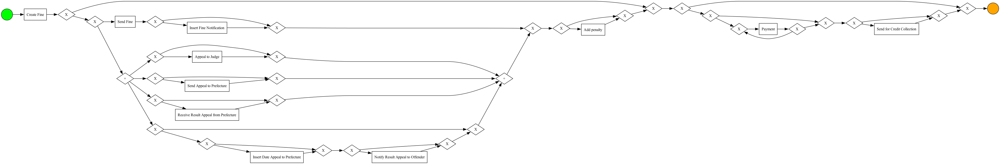

In [8]:
bpmn_model = pm4py.discover_bpmn_inductive(event_log, noise_threshold=0.1)
pm4py.view_bpmn(bpmn_model)

There are a number of traces that are not that common our handmade BPMN model covers the most usual traces only. Here are two traces of the generated model that are not present in our model from task 4.
 - We did not consider cases where the fine is not sent before being paid
 - We did not consider cases where the trace does not follow the strict sequence "Insert date appeal to prefecture -> Send Appeal to Prefecture -> Receive Result Appeal from Prefecture -> Notify Result Appeal to Offender". In the generated BPMN model, this actions can happen in any order.

# Session 4

## Task 1

|             | Statistics/Overview/Events over time                                                              | Statistics/Overview/Active cases over time            |
|-------------|---------------------------------------------------------------------------------------------------|-------------------------------------------------------|
| Observation | There appear to be somewhat periodic occurrences of comparably very hihg numbers of events/day.   | The appears to be some seasonality pattern.           |
| Question    | What causes these abnormaly high spikes?                                                          | What are the parameters that dictate the seasonality? |

## Task 2


In [ ]:
import plotly.express as px
import pm4py

df = pm4py.convert_to_dataframe(event_log)

# Ensure the 'time:timestamp' column is in datetime format
df['time:timestamp'] = pd.to_datetime(df['time:timestamp'])

# Filter the data to only include cases from the year 2000
df_2000 = df[df['time:timestamp'].dt.year == 2000]

# Extract the start time (the first event per case) for the year 2000
case_start_times = df_2000.groupby('case:concept:name')[
    'time:timestamp'].min().reset_index()

# Plot histogram of case start times
fig = px.histogram(case_start_times, x='time:timestamp', nbins=365, width=700)

# Update layout for better visuals
fig.update_layout(
    bargap=0.05,
    title="Case Arrivals in the Year 2000",
    xaxis_title="Start Time",
    yaxis_title="Number of Cases",
    # Format x-axis as day-month-year
    xaxis=dict(tickformat="%d-%m-%Y"),
)

# Show the plot
fig.show()

We observed the following patterns:

1. Seasonality:
 - There is a notable peak in case arrivals during the summer months, especially between June and September, with the highest spike observed in July. This could suggest yearly seasonality.
2.	Low activity at the beginning and end of the year:
 - The case arrivals are much lower in January and December compared to the middle of the year. This could indicate fewer activities (holidays, vacations) due to seasonal factors.

## Task 3

In [ ]:
import plotly.express as px
import pm4py

df['time:timestamp'] = pd.to_datetime(df['time:timestamp'])

# Extract the month and year from the 'time:timestamp' column
df['month'] = df['time:timestamp'].dt.month
df['year'] = df['time:timestamp'].dt.year

# Extract the first event for each case
case_start_times = df.groupby('case:concept:name')[
    'time:timestamp'].min().reset_index()

# Extract the month and year for the first event of each case
case_start_times['month'] = case_start_times['time:timestamp'].dt.month
case_start_times['year'] = case_start_times['time:timestamp'].dt.year

# Group by month and year to get the case arrival counts
monthly_case_counts = case_start_times.groupby(
    ['year', 'month']).size().reset_index(name='Number of Cases')

# Plot the distribution of case arrivals for each calendar month, grouped by year
fig = px.histogram(
    monthly_case_counts,
    x='month',
    y='Number of Cases',
    color='year',
    barmode='group',
    width=800,
    title="Case Arrivals per Month by Year"
)

# Update layout for better visuals
fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Number of Cases",
    bargap=0.1,
    xaxis=dict(tickmode='array', tickvals=list(range(1, 13)), ticktext=[
        'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

# Show the plot
fig.show()

Across all years, we see a consistent pattern where case arrivals rise steadily from the beginning of the year and peak in the summer months, followed by a decline towards the end of the year. This seasonal pattern appears to be stable across most years, indicating a consistent monthly seasonality.

### Drift

We can observe drift that is consistent over all months of the years. Roughly speaking, the years 2000 to 2002 exhibit higher case arrivals per month compared to 2003-2005 when case arrivals appear to be lower throughout the year. The years 2005 to 2008 then again exhibit higher case arrivals before the case arrivals decline again in the following years.

### Outliers

There are some outliers in the year 2004. While in the early months case arrivals are lower compared to other years, they are much higher in the summer nonths of July and August. There are other outliers such as the year 2005 which shows signigicantly more case arrivals than usual in the late months of the year.

## Task 5

<img src="images/sesh4-task5.png" alt="Disco absolute time distribution filtered for 'send fine' and 'send for credit collection'" style="width: 1000px;"/>

### Observations

We can observe large spikes in the timeline and smaller, more frequent spikes. The 'Send for Credit Collection' corresponds to the large spikes in the timeline. The distribution for this activity is not continuous and not really spaced evenly over time. The smaller, frequent spikes correspond to the 'Send Fine' activity. They are more continuous and more evenly spaced.

### Interpretation

The distribution of 'Send for Credit Collection' suggests that this activity is being performed in batch processing, where cases accumulate over time and get processed in bulk in a more or less periodic manner. In contrast the frequent and ongoing distribution of 'Send Fine' implies that fines are being issued on a more regular consistent basis, potentially in small batches. The large peaks for “Send for Credit Collection” could indicate potential bottlenecks in the process, especially if many cases are being processed in a single go, which could overwhelm resources or slow down other parts of the workflow.

# Analytics Lists

## Interesting Findings
- The median of the initial fine amount is very distant from the maximum, in fact only 9 entries have an initial fine amount of over 900. 


## Process Improvements 
- All the missing values in the amount and payment columns turned out to be a hurdle for addition and other multiplications so we replaced them with 0.

## Open Questions
- Why are so many cases closed even if the final outstanding payment is not equal to 0?